In [6]:
!unzip -q trafic_32.zip

In [3]:
%pip install lightning optuna torchmetrics[image] kornia optuna-integration torch-fidelity tensorboard matplotlib
%load_ext tensorboard

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.5/159.5 kB 1.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 20.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.2/305.2 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 23.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 22.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 5.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as FV
import torch.optim
from torch.utils.data import DataLoader, TensorDataset, random_split

from tqdm import tqdm
import os

import torchvision
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
import lightning as L
from torchmetrics import Accuracy
from lightning.pytorch.loggers import TensorBoardLogger
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
import kornia.augmentation as Kaug
import kornia as K
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
from torchvision import transforms
from PIL import Image
import os
from torchmetrics.image.fid import FrechetInceptionDistance
import optuna

from utils import show
from data import get_sanity_dataset, ClassSampler, DiffiusionDataModule, PreProcess
from blocks import UNet, UpBlock, DownBlock, ResidualBlock

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
NUM_WORKERS = int(os.cpu_count() / 2)
CLASSES_NO = 43
NUM_STEPS = 1000
plt.rcParams["savefig.bbox"] = 'tight'

In [2]:
import math
def sinusoidal_embedding(x):
    log_min_freq = math.log(1.0)
    log_max_freq = math.log(1000.0)
    num_frequencies = 16
    frequencies = torch.exp(torch.linspace(log_min_freq, log_max_freq, num_frequencies, dtype=torch.float32)).to(DEVICE)
    angular_speeds = 2.0 * math.pi * frequencies
    sin_embeddings = torch.sin(angular_speeds.unsqueeze(1) * x).to(DEVICE)
    cos_embeddings = torch.cos(angular_speeds.unsqueeze(1) * x).to(DEVICE)
    embeddings = torch.cat([sin_embeddings, cos_embeddings], dim=1)
    return embeddings.view(-1, 32, 1, 1)

def cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = torch.tensor(0.00, device=DEVICE)
    max_signal_rate = torch.tensor(0.99, device=DEVICE)
    start_angle = torch.acos(max_signal_rate).to(DEVICE)
    end_angle = torch.acos(min_signal_rate).to(DEVICE)
    angles = start_angle+diffusion_times*(end_angle-start_angle)
    signal_rates = torch.cos(angles).to(DEVICE)
    noise_rates = torch.sin(angles).to(DEVICE)
    return noise_rates, signal_rates

class LinearNoiseScheduler:
    def __init__(self, num_steps, device, beta_start=1e-4, beta_end=2e-2):
        
        self.device = device
        
        self.num_steps = num_steps
        self.beta_start = beta_start
        self.beta_end = beta_end
        self.betas = torch.linspace(self.beta_start, self.beta_end, self.num_steps, dtype=torch.float32, device=self.device)
        self.alphas = 1.0 - self.betas
        self.alpha_bars = torch.cumprod(self.alphas, dim=0)
        
    def get_alpha_bar(self, t):
        return self.alpha_bars[t]
    
    def get_variance(self, t):
        return self.betas[t]
    
    def get_rates(self, t):
        alpha_bar_t = self.get_alpha_bar(t)
        return (
            torch.sqrt(alpha_bar_t).to(self.device).unsqueeze(1).unsqueeze(2).unsqueeze(3),
            torch.sqrt(1 - alpha_bar_t).to(self.device).unsqueeze(1).unsqueeze(2).unsqueeze(3)
        )
    
    def add_noise(self, x, noise, t):
        alpha_bar_t = self.get_alpha_bar(t)
        sqrt_alpha_bar_t = torch.sqrt(alpha_bar_t).unsqueeze(1).unsqueeze(2).unsqueeze(3)
        sqrt_one_minus_alpha_bar_t = torch.sqrt(1 - alpha_bar_t).unsqueeze(1).unsqueeze(2).unsqueeze(3)
        return (sqrt_alpha_bar_t * x + sqrt_one_minus_alpha_bar_t * noise), sqrt_alpha_bar_t, sqrt_one_minus_alpha_bar_t

def validate_linear_scheduler():
    dt, kr = get_sanity_dataset()
    x, y = next(iter(dt))
    x, y = x.to(DEVICE), y.to(DEVICE)
    # show(x)
    x = kr(x)
    num_steps = 1000
    scheduler = LinearNoiseScheduler(num_steps, DEVICE, 1e-4, 5e-3)
    t = torch.linspace(0, num_steps-1, x.shape[0], dtype=torch.int32)
    noise = torch.randn_like(x)
    x_noisy = torch.clamp(scheduler.add_noise(x, noise, t)[0], -1, 1)
    # plt.plot((1-scheduler.alpha_bars.cpu())**0.5)
    # plt.plot((scheduler.alpha_bars)**0.5)
    show(torch.cat([x_noisy, x], dim=0).cpu(), True)



### Noise schedule validate

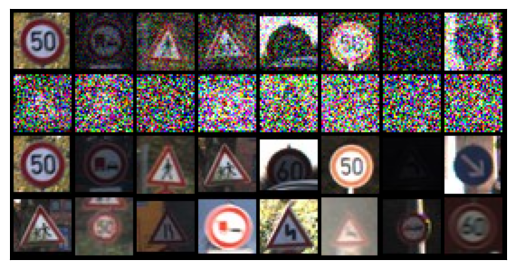

In [3]:
validate_linear_scheduler()


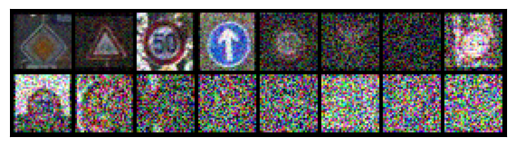

In [45]:
dt, kr = get_sanity_dataset()
x, y = next(iter(dt))
x, y = x.to(DEVICE), y.to(DEVICE)
x = kr(x)

diff_times = torch.linspace(0.0, 1.0, x.shape[0], device=DEVICE).view(-1, 1, 1, 1)
noise_amount, signal_amount = cosine_diffusion_schedule(diff_times)

noise = torch.rand_like(x, device=DEVICE)*2-1

x = x*signal_amount + noise * noise_amount
x = torch.clamp(x, -1, 1)
show(x.cpu())

### UNet validate

100%|██████████| 16/16 [00:01<00:00,  9.47it/s]


Validation Loss after epoch 1: 0.06619458994828165


100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


Validation Loss after epoch 2: 0.0484689783770591


100%|██████████| 16/16 [00:01<00:00, 10.29it/s]


Validation Loss after epoch 3: 0.04409151617437601


100%|██████████| 16/16 [00:01<00:00,  9.17it/s]


Validation Loss after epoch 4: 0.03870821185410023


100%|██████████| 16/16 [00:01<00:00,  9.77it/s]


Validation Loss after epoch 5: 0.0337734300410375


100%|██████████| 16/16 [00:01<00:00, 10.12it/s]


Validation Loss after epoch 6: 0.03416842105798423


100%|██████████| 16/16 [00:01<00:00,  9.58it/s]


Validation Loss after epoch 7: 0.03128056006971747


100%|██████████| 16/16 [00:01<00:00,  8.95it/s]


Validation Loss after epoch 8: 0.03090367780532688


100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


Validation Loss after epoch 9: 0.03080633212812245


100%|██████████| 16/16 [00:01<00:00,  9.39it/s]


Validation Loss after epoch 10: 0.030406813020817935


100%|██████████| 16/16 [00:01<00:00,  9.94it/s]


Validation Loss after epoch 11: 0.027676101308315992


100%|██████████| 16/16 [00:01<00:00,  9.56it/s]


Validation Loss after epoch 12: 0.02826401125639677


100%|██████████| 16/16 [00:01<00:00, 10.08it/s]


Validation Loss after epoch 13: 0.028873623348772526


100%|██████████| 16/16 [00:01<00:00,  9.10it/s]


Validation Loss after epoch 14: 0.027207016362808645


100%|██████████| 16/16 [00:01<00:00,  9.43it/s]


Validation Loss after epoch 15: 0.02795259526465088


100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Validation Loss after epoch 16: 0.026066756574437022


100%|██████████| 16/16 [00:01<00:00, 10.04it/s]


Validation Loss after epoch 17: 0.027029543300159276


100%|██████████| 16/16 [00:01<00:00, 10.33it/s]


Validation Loss after epoch 18: 0.025966505170799792


100%|██████████| 16/16 [00:01<00:00, 10.32it/s]


Validation Loss after epoch 19: 0.02444728882983327


100%|██████████| 16/16 [00:01<00:00,  8.53it/s]


Validation Loss after epoch 20: 0.024901734781451523


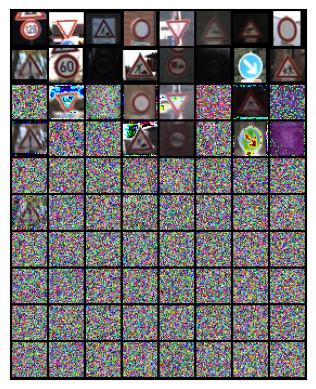

In [6]:
def validate_unet():
    dt, kr = get_sanity_dataset(256)
    dv, kr = get_sanity_dataset(256, 'val')
    model = UNet(CLASSES_NO, DEVICE, sinusoidal_embedding).to(DEVICE)
    scheduler = LinearNoiseScheduler(NUM_STEPS, DEVICE)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    for ep in range(20):
        i = 0
        for x, y in tqdm(dt):
            x, y = x.to(DEVICE), y.to(DEVICE)
            x = kr(x)
            optimizer.zero_grad()
            t = torch.randint(0, NUM_STEPS-1, (x.shape[0],), device=DEVICE)
            noise = torch.randn_like(x, device=DEVICE)
            noised = scheduler.add_noise(x, noise, t)[0]
            # noised = torch.clamp(noised, -1, 1)
            logits = model(noised, scheduler.get_variance(t), y)
            loss = criterion(noise, logits)
            loss.backward()
            optimizer.step()
            i+=1
        model.eval()
        val_losses = []
        with torch.no_grad():
            for x, y in tqdm(dv):
                x, y = x.to(DEVICE), y.to(DEVICE)
                x = kr(x)
                
                t = torch.randint(0, NUM_STEPS-1, (x.shape[0],), device=DEVICE)
                noise = torch.randn_like(x, device=DEVICE)
                noised = scheduler.add_noise(x, noise, t)[0]
                # noised = torch.clamp(noised, -1, 1)
                logits = model(noised, scheduler.get_variance(t), y)
                loss = criterion(noise, logits)
                val_losses.append(loss.item())
            avg_val_loss = sum(val_losses) / len(val_losses)
            print(f"Validation Loss after epoch {ep+1}: {avg_val_loss}")
    model.eval()
    with torch.no_grad():
        x, y = next(iter(dt))
        x, y = x.to(DEVICE), y.to(DEVICE)
        x = kr(x)
        
        t = torch.randint(0, NUM_STEPS-1, (x.shape[0],), device=DEVICE)
        noise = torch.randn_like(x, device=DEVICE)
        noised, signal_rates, noise_rates = scheduler.add_noise(x, noise, t)
        # noised = torch.clamp(noised, -1, 1)
        logits = model(noised, scheduler.get_variance(t), y)
        loss = criterion(noise, logits)
        pred_images = (noised - (noise_rates) * logits) / signal_rates
        show(torch.cat([
            x.cpu()[:16],
            pred_images.cpu()[:16],
            noised.cpu()[:16],
            noise.cpu()[:16],
            logits.cpu()[:16]
        ], dim=0))
    return model
unet_model = validate_unet()

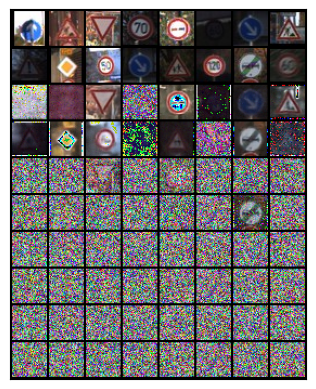

In [8]:
scheduler = LinearNoiseScheduler(NUM_STEPS, DEVICE)
dt, kr = get_sanity_dataset(256)

unet_model.eval()
with torch.no_grad():
    x, y = next(iter(dt))
    x, y = x.to(DEVICE), y.to(DEVICE)
    x = kr(x)
    
    t = torch.randint(0, NUM_STEPS-1, (x.shape[0],), device=DEVICE)
    noise = torch.randn_like(x, device=DEVICE)
    noised, signal_rates, noise_rates = scheduler.add_noise(x, noise, t)
    # noised = torch.clamp(noised, -1, 1)
    logits = unet_model(noised, scheduler.get_variance(t), y)
    pred_images = (noised - noise_rates * logits) / signal_rates
    show(torch.cat([
        x.cpu()[:16],
        pred_images.cpu()[:16],
        noised.cpu()[:16],
        noise.cpu()[:16],
        logits.cpu()[:16]
    ], dim=0))

In [84]:
class DiffusionModel(L.LightningModule):
    def __init__(self, sampler, model=None, transform=None, trial=None, diff_scheduler=cosine_diffusion_schedule,learning_rate=1e-3, class_emb_size=8, transformed_class_emb=32):
        super(DiffusionModel, self).__init__()
        self.save_hyperparameters()
        
        self.network: UNet = UNet(CLASSES_NO, self.hparams.class_emb_size, self.hparams.transformed_class_emb).to(DEVICE) if model is None else model
        self.sampler = sampler
        self.transform = transform if transform is not None else transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
        # self.ema_network = deepcopy(unet)
        self.cosine_diffusion_schedule = diff_scheduler
        self.trial = trial

    def forward(self, noisy_images, noise_rates, class_labels):
        return self.network(noisy_images, noise_rates**2, class_labels)

    def denoise(self, noisy_images, noise_rates, signal_rates, class_labels):
        pred_noises = self(noisy_images, noise_rates, class_labels)
        pred_images = (noisy_images - (noise_rates**2) * pred_noises) / signal_rates
        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps, class_labels):
        num_images = initial_noise.size(0)
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise

        for step in range(diffusion_steps):
            diffusion_times = torch.ones((num_images, 1, 1, 1), device=initial_noise.device) - step * step_size
            noise_rates, signal_rates = self.cosine_diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(current_images, noise_rates, signal_rates, class_labels)
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.cosine_diffusion_schedule(next_diffusion_times)
            current_images = next_signal_rates * pred_images + next_noise_rates * pred_noises
        return pred_images

    def denormalize(self, images):
        mean = torch.tensor((0.5, 0.5, 0.5), device=DEVICE).view(1, 3, 1, 1)  # Reshape to [1, C, 1, 1] for broadcasting
        var = torch.tensor((0.5, 0.5, 0.5), device=DEVICE).view(1, 3, 1, 1)
        images = mean + images * var
        return images

    def generate(self, num_images, diffusion_steps):
        initial_noise = torch.randn(num_images, 3, 32, 32, device=DEVICE)
        class_labels = self.sampler.sample(initial_noise)
        generated_images = self.reverse_diffusion(initial_noise, diffusion_steps, class_labels)
        generated_images = self.denormalize(generated_images)
        return generated_images
    
    def corrupt(self, images):
        noises = torch.randn_like(images)*2-1
        batch_size = images.size(0)
        diffusion_times = torch.rand(batch_size, 1, 1, 1, device=DEVICE)
        noise_rate, signal_rate = self.cosine_diffusion_schedule(diffusion_times)
        noised_imgs = signal_rate * images + noise_rate * noises
        noised_imgs = torch.clamp(noised_imgs, -1, 1)
        return noises, noised_imgs, noise_rate, signal_rate

    def training_step(self, batch, batch_idx):
        images, class_labels = batch
        images, class_labels = images.to(DEVICE), class_labels.to(DEVICE)
        
        if self.transform is not None:
            images = self.transform(images.to(DEVICE))
        noises, noised_imgs, noise_rate, signal_rate = self.corrupt(images)

        pred_noises, pred_images = self.denoise(noised_imgs, noise_rate, signal_rate, class_labels)
        loss = F.mse_loss(noises, pred_noises)
        if self.trainer:
            self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        images, class_labels = batch
        if self.transform is not None:
            images = self.transform(images.to(DEVICE))

        noises = torch.randn_like(images)*0.1
        batch_size = images.size(0)
        diffusion_times = torch.rand(batch_size, 1, 1, 1, device=DEVICE)
        noise_rates, signal_rates = self.cosine_diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises

        pred_noises, pred_images = self.denoise(noisy_images, noise_rates, signal_rates, class_labels)
        loss = F.mse_loss(noises, pred_noises)
        
        if self.trainer:
            self.log('val_loss', loss)
            self.logger.experiment.add_image("generated_images", make_grid(pred_images[:16]), self.current_epoch)

        if self.trial is not None:
            self.trial.report(loss, self.current_epoch)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.network.parameters(), lr=self.hparams.learning_rate)
        return optimizer

### Validate Diffusion

100%|██████████| 138/138 [00:32<00:00,  4.19it/s]
/tmp/ipykernel_72662/2220326295.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
100%|██████████| 138/138 [00:32<00:00,  4.19it/s]


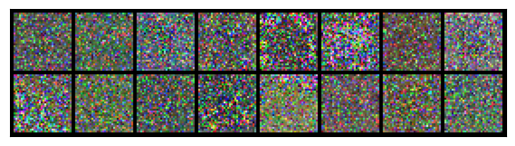

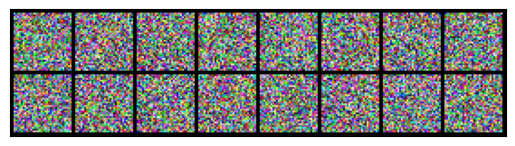

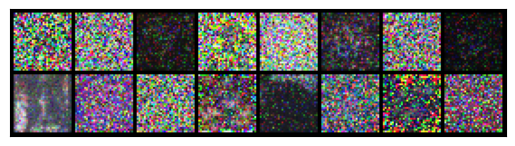

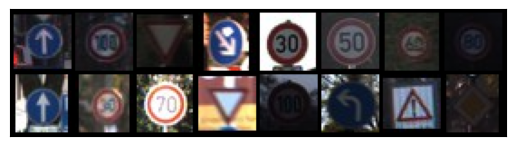

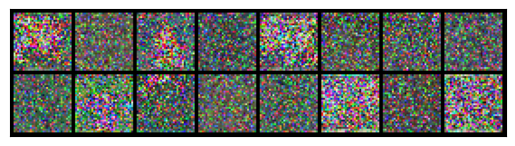

...

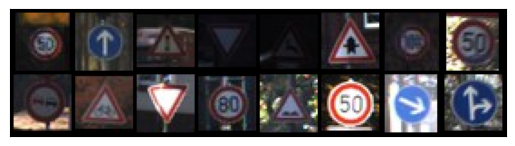

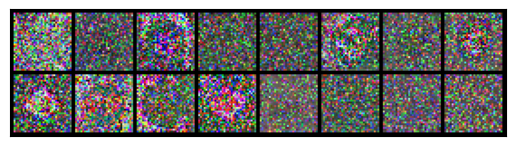

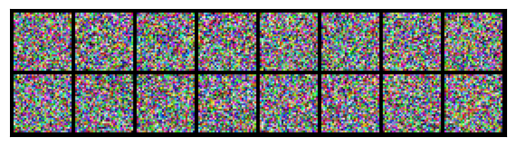

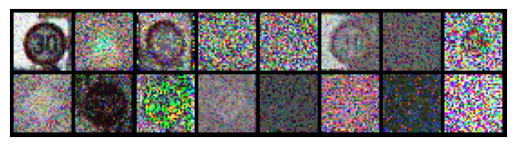

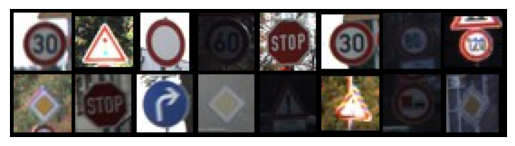

In [181]:
def validate_diff():
    dt, _ = get_sanity_dataset(256)
    sampler = ClassSampler(ImageFolder('trafic_32'))

    model = DiffusionModel(sampler).to(DEVICE)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    for _ in range(10):
        i = 0
        model.train()
        for x, y in tqdm(dt):
            optimizer.zero_grad()
            
            images, class_labels = x.to(DEVICE), y.to(DEVICE)
            images = model.transform(images.to(DEVICE))
            noises, noised_imgs, noise_rate, signal_rate = model.corrupt(images)

            pred_noises, pred_images = model.denoise(noised_imgs, noise_rate, signal_rate, class_labels)
            loss = F.mse_loss(noises, pred_noises)
            loss.backward()
            optimizer.step()
            i+=1
        model.eval()
        with torch.no_grad():
            x, y = next(iter(dt))
            x, y = x.to(DEVICE), y.to(DEVICE)
            x = model.transform(x)
            noises, noised_imgs, noise_rate, signal_rate = model.corrupt(x)
            pred_noises, pred_images = model.denoise(noised_imgs, noise_rate, signal_rate, y)
            show(pred_noises.cpu()[:16])
            show(noises.cpu()[:16])
            show(pred_images.cpu()[:16])
            show(x.cpu()[:16])
    return model
df_model = validate_diff()

### validate diffusion model denoise

/home/mszawerd/Learn/ium/.venv/lib/python3.10/site-packages/torchvision/transforms/functional.py:282: RuntimeWarning: invalid value encountered in cast
  npimg = (npimg * 255).astype(np.uint8)


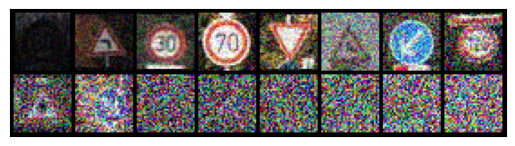

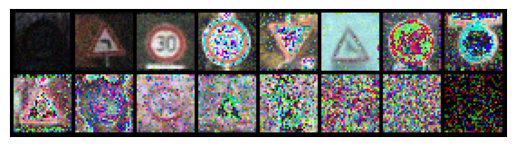

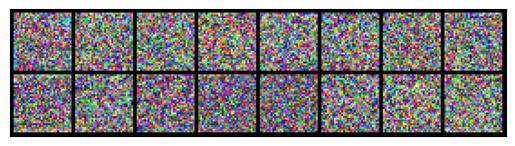

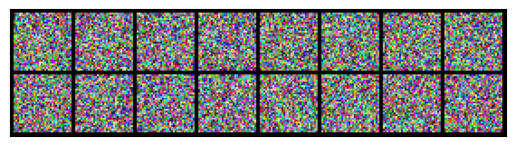

In [182]:
dt, kr = get_sanity_dataset()
x, y = next(iter(dt))
x, y = x.to(DEVICE), y.to(DEVICE)
x = kr(x)

diff_times = torch.linspace(0.0, 1.0, x.shape[0], device=DEVICE).view(-1, 1, 1, 1)
noise_amount, signal_amount = cosine_diffusion_schedule(diff_times)

noise = torch.rand_like(x, device=DEVICE)*2-1

x = x*signal_amount + noise * noise_amount
x = torch.clamp(x, -1, 1)
show(x.cpu())

pred_n, pred_img = df_model.denoise(x, noise_amount, signal_amount, y)
pred_img = df_model.denormalize(pred_img)
show(pred_img.cpu(), False)
show(pred_n.cpu())
show(noise.cpu())


### validate model generate

In [97]:
step_size = 1.0 / 10
diffusion_times = torch.ones((1, 1, 1, 1), device=DEVICE)*0.99 - 0 * step_size

In [184]:
df_model.eval()
steps = 10
step_size = 1.0 / steps
dt, kr = get_sanity_dataset()
x, y = next(iter(dt))
x, y = x.to(DEVICE), y.to(DEVICE)
x = kr(x)
with torch.no_grad():
    current_images = torch.randn(1, 3, 32, 32, device=DEVICE)
    class_labels = df_model.sampler.sample(current_images)
    diffusion_times = torch.ones((current_images.shape[0], 1, 1, 1), device=DEVICE)*0.99 - 0 * step_size
    noise_rates, signal_rates = df_model.cosine_diffusion_schedule(diffusion_times)
    for _ in range(1):
        pred_noises, pred_images = df_model.denoise(current_images, noise_rates, signal_rates, y)
        next_diffusion_times = diffusion_times - step_size
        next_noise_rates, next_signal_rates = df_model.cosine_diffusion_schedule(next_diffusion_times)
        current_images = next_signal_rates * pred_images + next_noise_rates * pred_noises
        current_images = torch.clamp(current_images, -1, 1)
        noise_rates, signal_rates = next_noise_rates, next_signal_rates
    show(pred_images.cpu())

RuntimeError: Sizes of tensors must match except in dimension 1. Expected size 1 but got size 16 for tensor number 1 in the list.

In [ ]:
logger = TensorBoardLogger("logs", name="dev", version="dev_6")
sampler = ClassSampler(ImageFolder('trafic_32'))
model = DiffusionModel(KorniaAugmentationHVFlip_Jitter()).to(DEVICE)
trainer = L.Trainer(max_epochs=20, 
                        accelerator="gpu", 
                        callbacks=L.pytorch.callbacks.EarlyStopping(monitor='val_loss', patience=7, strict=False, verbose=False, mode='min'),
                        logger=logger
                        )
trainer.fit(model, DiffiusionDataModule())

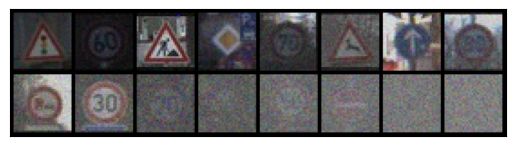

In [174]:
transform = KorniaAugmentationHVFlip_Jitter()
def cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = torch.tensor(0.00, device=DEVICE)
    max_signal_rate = torch.tensor(0.95, device=DEVICE)
    start_angle = torch.acos(max_signal_rate).to(DEVICE)
    end_angle = torch.acos(min_signal_rate).to(DEVICE)
    angles = start_angle+diffusion_times*(end_angle-start_angle)
    signal_rates = torch.cos(angles).to(DEVICE)
    noise_rates = torch.sin(angles).to(DEVICE)
    return noise_rates, signal_rates
def diffuse(batch):
    images, class_labels = batch
    images = transform(images.to(DEVICE))
    noises = torch.randn_like(images)*1e-1
    batch_size = images.size(0)
    diffusion_times = torch.rand(batch_size, 1, 1, 1, device=DEVICE)
    diffusion_times = torch.linspace(0.0, 1.0, batch_size, device=DEVICE).view(16, 1, 1, 1)
    noise_rate, signal_rate = cosine_diffusion_schedule(diffusion_times)
    noisy_images = images * signal_rate + noises * noise_rate
    return noisy_images.cpu()

show(diffuse(example_batch), True)

tensor([21, 41,  9, 10, 30,  9, 33, 15, 12, 42,  2, 42, 11, 15,  3,  2])


RuntimeError: shape '[16, 1, 1, 1]' is invalid for input of size 128

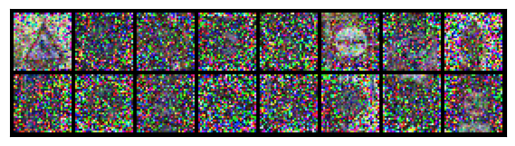

In [293]:
diffusion_times = torch.ones((1, 1, 1, 1), device=DEVICE)*0.01
noise_rates, signal_rates = cosine_diffusion_schedule(diffusion_times)
x = KorniaAugmentationHVFlip_Jitter()(example_batch[0]).to(DEVICE)
x = x+noise_rates*torch.randn_like(x, device=DEVICE)
print(example_batch[1])
show(x.cpu())
bs, ch, w, h = x.shape
class_cond = model.class_emb(example_batch[1].view(16, 1, 1, 1).to(DEVICE))
class_cond = class_cond.view(bs, class_cond.shape[1], 1, 1).expand(bs, class_cond.shape[1], w, h)
model.network(x, noise_rates**2, class_cond).to(DEVICE)
# x = model.reverse_diffusion(x_start, 100, cls_s)
# x = model.denormalize(x)
# show(x.cpu())

# noise, x = model.denoise(x_start, noise_rates, signal_rates, cls_s)
# x = signal_rates * x + noise_rates * noise

# show(x_start.cpu())
# show(x.cpu())


In [292]:
model.class_emb(example_batch[1].to(DEVICE)).shape

torch.Size([16, 8])

In [185]:
# generator = DiffusionModel.load_from_checkpoint("/home/mszawerd/Learn/ium/gen/epoch37-step5244.ckpt", sampler=sampler, tranform=KorniaAugmentationHVFlip_Jitter())
TensorBoardLogger("logs", name="dev", version="dev_6").experiment.add_image("response", make_grid(model.generate(1, 1000)), 1)

AttributeError: 'KorniaAugmentationHVFlip_Jitter' object has no attribute 'sample'